In [1]:
import os, lasio
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# Scan all 2020 FORCE .las files
force_files = []
for root, dirs, files in os.walk("data/2020_force"):
    for file_name in files:
        if file_name.endswith(".las"):
            force_files.append(os.path.join(root, file_name))
print(f"Found {len(force_files)} LAS files, including:{[os.path.basename(f) for f in force_files]}")

Found 118 LAS files, including:['34_3-1 A.las', '31_2-8.las', '31_2-9.las', '34_12-1.las', '35_12-1.las', '7_1-2 S.las', '34_4-10 R.las', '34_2-4.las', '31_5-4 S.las', '16_10-5.las', '25_4-5.las', '34_3-3 A.las', '25_11-15.las', '25_6-2.las', '34_7-21.las', '34_7-20.las', '25_6-3.las', '36_7-3.las', '35_4-1.las', '25_2-7.las', '16_10-1.las', '33_9-1.las', '16_8-1.las', '16_10-3.las', '16_2-16.las', '25_6-1.las', '25_11-5.las', '16_10-2.las', '31_6-8.las', '35_9-8.las', '34_10-16 R.las', '34_11-1.las', '35_11-1.las', '35_9-6 S.las', '25_5-4.las', '15_9-17.las', '15_9-15.las', '25_2-14.las', '35_3-7 S.las', '25_3-1.las', '15_9-14.las', '35_11-7.las', '25_5-3.las', '25_11-19 S.las', '34_8-7 R.las', '35_11-6.las', '35_8-6 S.las', '25_7-2.las', '15_9-13.las', '17_11-1.las', '25_5-1.las', '26_4-1.las', '35_11-5.las', '34_3-2 S.las', '25_9-1.las', '31_3-2.las', '16_11-1 ST3.las', '15_9-23.las', '35_11-11.las', '16_5-3.las', '34_10-33.las', '35_11-10.las', '16_2-11 A.las', '31_3-3.las', '32_2-

In [3]:
def move_column_to_first(df, col_name):
    """Move a specified column to the first position in a DataFrame."""
    cols = [col_name] + [col for col in df.columns if col != col_name]
    return df[cols]
def move_column_to_last(df, col_name):
    """Move a specified column to the last position in a DataFrame."""
    cols = [col for col in df.columns if col != col_name] + [col_name]
    return df[cols]

In [4]:
las = lasio.read(force_files[0])
las_df = las.df()
las_df['WELL'] = os.path.basename(force_files[0].split('.')[0])
las_df = las_df.reset_index()

for f in force_files[1:]:
    _las = lasio.read(f)
    _las_df = _las.df()
    _las_df['WELL'] = os.path.basename(f.split('.')[0])
    _las_df = _las_df.reset_index()

    las_df = pd.concat([las_df, _las_df], axis=0)
# Rename columns by dict
new_names = {'FORCE_2020_LITHOFACIES_CONFIDENCE': 'LITHO_CONF', 'FORCE_2020_LITHOFACIES_LITHOLOGY': 'LITHO_CODE', 'MUDWEIGHT': 'MUD'}
las_df = las_df.rename(columns=new_names)

las_df = move_column_to_first(las_df, 'WELL')
las_df = move_column_to_last(las_df, 'LITHO_CODE')
las_df = move_column_to_last(las_df, 'LITHO_CONF')

las_df.to_csv('data/force_2020.csv', index=False)
print(f"Saved {len(las_df)} rows to data/force_2020.csv")
las_df.head()

Saved 2337639 rows to data/force_2020.csv


,WELL,DEPT,CALI,BS,ROPA,ROP,RDEP,RMED,RMIC,DTS,...,Y_LOC,Z_LOC,RSHA,RXO,SP,SGR,DCAL,MUD,LITHO_CODE,LITHO_CONF
0,34_3-1 A,436.216715,NaN,NaN,NaN,484.595093,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,34_3-1 A,436.368715,NaN,NaN,NaN,248.021545,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,34_3-1 A,436.520715,NaN,NaN,NaN,163.891479,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,34_3-1 A,436.672715,NaN,NaN,NaN,107.911980,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,34_3-1 A,436.824715,NaN,NaN,NaN,96.232262,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: >

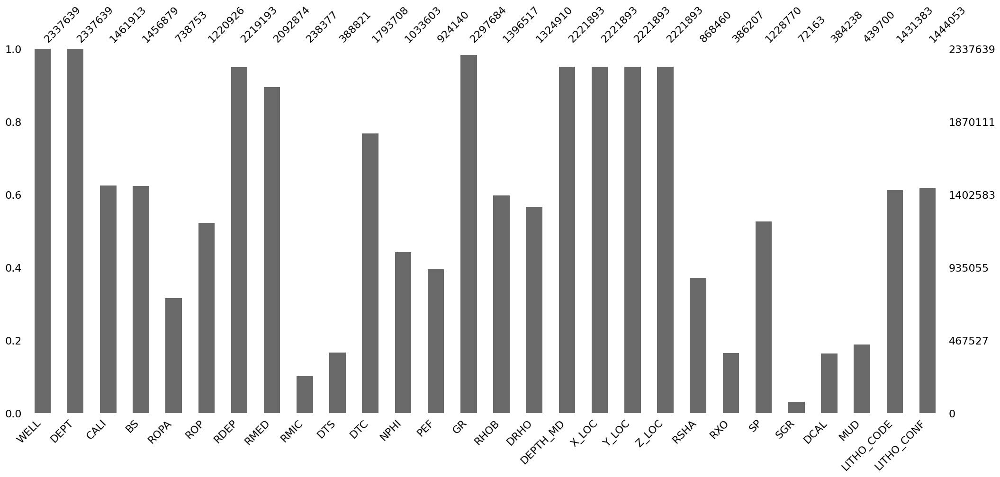

In [5]:
import missingno as msno
#Bar Chart
msno.bar(las_df)


<Axes: >

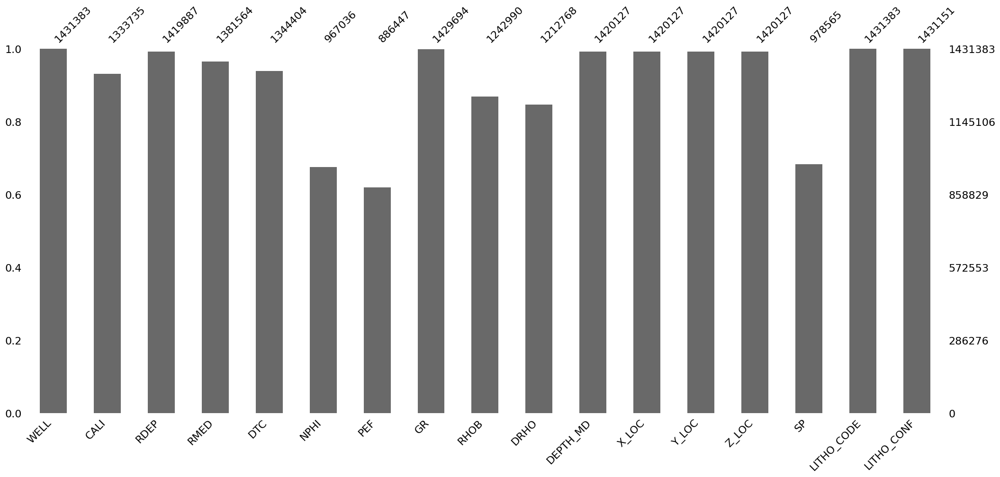

In [6]:
# Dropping missing rows by LITHO_CODE column
las_df = las_df.dropna(subset=['LITHO_CODE'])
drop_cols = ['ROPA', 'ROP', 'RMIC', 'DTS', 'DCAL', 'MUD', 'SGR', 'RXO', 'RSHA', 'BS', 'DEPT']
dropped_las_df = las_df.drop(columns=drop_cols)
msno.bar(dropped_las_df)


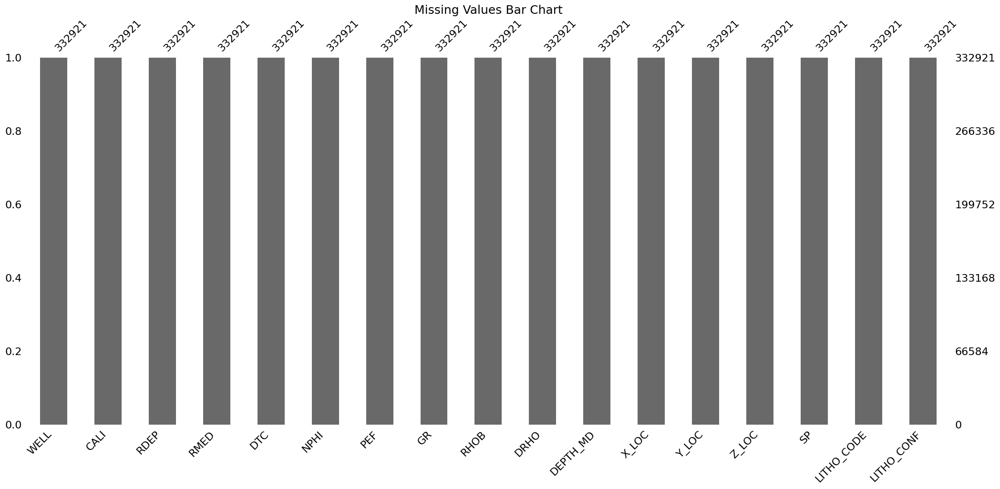

In [7]:
# Drop all null values
d2_las_df = dropped_las_df.dropna()
msno.bar(d2_las_df)
# Add title
plt.title("Missing Values Bar Chart", fontsize=18)

# Show the plot
plt.show()

In [8]:
d2_las_df.isnull().sum()


WELL          0
CALI          0
RDEP          0
RMED          0
DTC           0
NPHI          0
PEF           0
GR            0
RHOB          0
DRHO          0
DEPTH_MD      0
X_LOC         0
Y_LOC         0
Z_LOC         0
SP            0
LITHO_CODE    0
LITHO_CONF    0
dtype: int64

In [9]:
d2_las_df.describe()

,CALI,RDEP,RMED,DTC,NPHI,PEF,GR,RHOB,DRHO,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,SP,LITHO_CODE,LITHO_CONF
count,332921.000000,332921.000000,332921.000000,332921.000000,332921.000000,332921.000000,332921.000000,332921.000000,332921.000000,332921.000000,332921.000000,3.329210e+05,332921.000000,332921.000000,332921.000000,332921.000000
mean,11.952636,4.418829,4.852784,104.802573,0.341094,6.165037,73.856576,2.328078,0.006593,2503.413396,478507.801398,6.664489e+06,-2463.793132,51.762139,60610.633075,1.091238
std,2.979670,29.279359,26.291798,28.138885,0.134730,12.034934,33.888440,0.235546,0.057415,850.788747,37830.019150,1.367101e+05,837.610780,83.996859,13892.533611,0.329301
min,3.336693,0.087607,0.139221,7.415132,-0.035822,0.099718,0.898921,1.127937,-1.304251,445.065094,423237.531250,6.435551e+06,-4747.778320,-999.000000,30000.000000,1.000000
25%,9.047000,0.983385,1.026072,82.193962,0.246543,3.325447,54.535378,2.153907,-0.011507,1916.767944,443864.406250,6.478961e+06,-3043.695313,33.211334,65000.000000,1.000000
50%,12.275778,1.741486,1.923272,97.617836,0.338488,4.039392,71.972382,2.374308,-0.000256,2507.510498,469582.531250,6.749869e+06,-2471.597412,60.492138,65000.000000,1.000000
75%,13.374681,3.837564,4.423553,128.841614,0.434485,5.223768,89.107681,2.516998,0.016399,3086.321045,521498.593750,6.777268e+06,-1887.048828,82.582466,65000.000000,1.000000
max,26.125000,1999.877808,1988.616333,320.478882,0.999570,382.121826,1076.963867,3.353153,1.284299,4819.024902,551813.125000,6.847164e+06,-420.062256,273.084320,99000.000000,3.000000


In [10]:
d2_las_df.WELL.value_counts()

WELL
33_9-17       17337
15_9-14       16689
31_2-19 S     16070
34_10-16 R    14006
34_10-21      13946
15_9-15       13288
35_11-6       13075
15_9-17       13058
26_4-1        13047
35_11-11      12653
15_9-13       12202
34_8-1        12150
25_2-7        12045
34_11-2 S     11440
16_10-1       11265
31_2-8        10739
16_7-5        10251
16_7-6        10180
31_2-10        8880
35_11-1        8785
31_2-9         8661
35_11-7        7217
35_11-5        7070
35_12-1        7065
25_8-5 S       6899
25_3-1         6009
31_4-5         4182
25_2-14        3845
34_2-4         3588
29_6-1         3429
25_5-3         3409
34_10-35       3387
25_5-1         3344
30_6-5         2572
25_5-4         2550
16_10-2        2412
25_8-7         2313
25_2-13 T4     1574
31_2-7         1030
16_4-1          769
31_3-2          432
34_7-21          58
Name: count, dtype: int64

In [75]:
well_df_1 = d2_las_df[d2_las_df.WELL == '33_9-17']
well_df_1.head()

,WELL,CALI,RDEP,RMED,DTC,NPHI,PEF,GR,RHOB,DRHO,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,SP,LITHO_CODE,LITHO_CONF
2096,33_9-17,13.570298,1.298060,1.068349,136.148621,0.480000,28.548046,59.707588,1.812042,-0.150246,573.201965,438476.6875,6814189.0,-547.119141,26.807169,65000.0,1.0
2097,33_9-17,15.068716,1.260165,0.832719,144.943619,0.463102,42.167393,60.435368,1.846628,-0.053174,573.354004,438476.6875,6814189.0,-547.271179,26.327555,65000.0,1.0
2098,33_9-17,16.317593,1.220263,0.833197,157.991302,0.476845,58.765369,60.801056,1.881826,-0.030519,573.505981,438476.6875,6814189.0,-547.423157,25.197205,65000.0,1.0
2099,33_9-17,17.051016,1.179388,0.917527,167.588303,0.496792,69.735527,55.942467,1.919708,-0.021832,573.657959,438476.6875,6814189.0,-547.575073,24.370316,65000.0,1.0
2100,33_9-17,17.143158,1.134571,1.074473,172.933548,0.516738,71.678764,57.223038,1.929080,-0.024574,573.809998,438476.6875,6814189.0,-547.727112,23.413076,65000.0,1.0


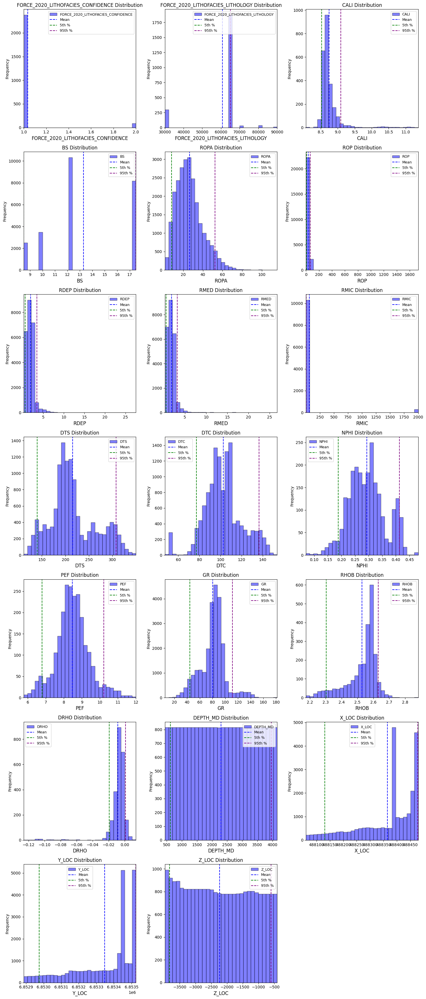

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Load LAS file and extract dataframe
df = las.df()

# Select only numeric columns
numeric_cols = df.select_dtypes(include=[np.number]).columns

# Define grid size: 3 columns and dynamically determine rows
num_cols = len(numeric_cols)
num_rows = int(np.ceil(num_cols / 3))  # Ensure enough rows for all columns

# Create subplots with 3 columns
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))  # Adjust figure size dynamically
axes = axes.flatten()  # Flatten grid for easy indexing

# Loop through columns and plot histograms
for i, col in enumerate(numeric_cols):
    ax = axes[i]
    col_mean = df[col].mean()
    col_p5 = df[col].quantile(0.05)
    col_p95 = df[col].quantile(0.95)

    df[col].plot(kind='hist', bins=30, color='blue', alpha=0.5, edgecolor='black', ax=ax)
    ax.axvline(col_mean, color='blue', linestyle='--', label='Mean')
    ax.axvline(col_p5, color='green', linestyle='--', label='5th %')
    ax.axvline(col_p95, color='purple', linestyle='--', label='95th %')

    ax.set_xlabel(col, fontsize=12)
    ax.set_ylabel('Frequency', fontsize=10)
    ax.set_xlim(df[col].min(), df[col].max())
    ax.legend(fontsize=9)
    ax.set_title(f'{col} Distribution', fontsize=12)

# Hide empty subplots if any (in case columns < total subplots)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [13]:
# pairplot for well_df_1 dataframe
import seaborn as sns
# sns.pairplot(well_df_1, hue='LITHO_CODE', diag_kind='kde', height=2.5)

In [14]:
from view_curves import view_curves
curves = ['CALI', 'RDEP', 'RMED', 'RHOB', 'GR', 'NPHI', 'PEF', 'DTC', 'DRHO', 'SP', 'LITHO_CODE', 'LITHO_CONF']
view_curves(well_df_1, curves, log=['RDEP', 'RMED'],
         depth_col='DEPTH_MD'
         )

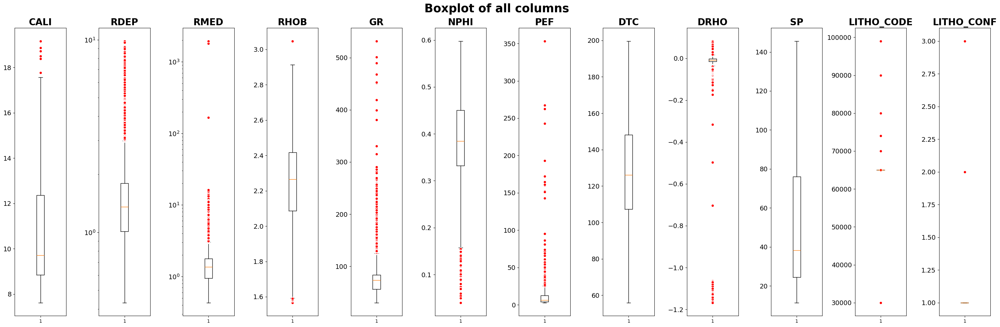

In [52]:
red_circle = dict(markerfacecolor='red', marker='o', markeredgecolor='white')
curves = ['CALI', 'RDEP', 'RMED', 'RHOB', 'GR', 'NPHI', 'PEF', 'DTC', 'DRHO', 'SP', 'LITHO_CODE', 'LITHO_CONF']
df_plot = well_df_1[curves]
fig, axs = plt.subplots(1, len(df_plot.columns), figsize=(30,10))

for i, ax in enumerate(axs.flat):
    ax.boxplot(df_plot.iloc[:,i], flierprops=red_circle)
    df_plot.iloc[:,i]
    ax.set_title(df_plot.columns[i], fontsize=20, fontweight='bold')
    ax.tick_params(axis='y', labelsize=14)
    
    #Checking if column names are equal to columns we expect to be logarithmic
    if df_plot.columns[i] == 'RDEP' or df_plot.columns[i] == 'RMED':
        ax.semilogy()
    # Add title
plt.suptitle("Boxplot for curves in Well 33_9-17", fontsize=25, fontweight='bold')
    
plt.tight_layout()

In [65]:
litho_df = d2_las_df[['LITHO_CODE', 'DEPTH_MD']]
litho_df['LITHO_CODE'].value_counts()

LITHO_CODE
65000.0    205280
30000.0     52259
65030.0     42021
70000.0     16150
80000.0      7985
70032.0      4092
99000.0      2490
90000.0      2290
74000.0       334
88000.0        20
Name: count, dtype: int64

/var/folders/r3/x33m7bkj4dxcdt5jwwgg27xc0000gn/T/ipykernel_12414/1757556120.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



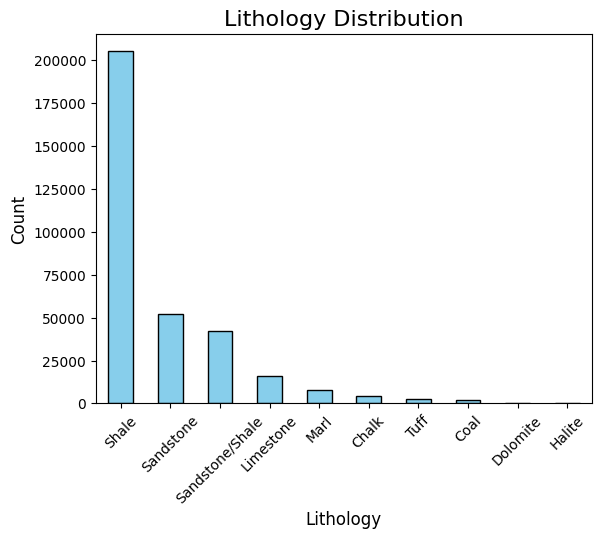

In [67]:
d2_las_df.LITHO_CODE.value_counts()
litho_dict = {
    30000: 'Sandstone', 
    65030: 'Sandstone/Shale', 
    65000: 'Shale', 
    80000: 'Marl',
    74000: 'Dolomite',
    70000: 'Limestone',
    70032: 'Chalk',
    88000: 'Halite',
    86000: 'Anhydrite',
    99000: 'Tuff',
    90000: 'Coal',
    93000: 'Basement'
}
# Plot distribution of LITHO_CODE and rename the classes by litho_dict
litho_df = d2_las_df[['LITHO_CODE', 'DEPTH_MD']]
litho_df['LITHO_CODE'] = litho_df['LITHO_CODE'].map(litho_dict)
litho_df['LITHO_CODE'].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Lithology Distribution', fontsize=16)
plt.xlabel('Lithology', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()


In [76]:
from view_curves import view_curves
curves = ['RMED', 'PEF', 'DRHO']
view_curves(well_df_1, curves, log=['RDEP', 'RMED'],
         depth_col='DEPTH_MD'
         )

In [77]:
# Median of RMED between 1780 and 1790
median_rmed = well_df_1[(well_df_1.DEPTH_MD >= 1750) & (well_df_1.DEPTH_MD <= 1850)]['RMED'].median()
# Replace outliers of RMED values between 1780 and 1790 with mean_rmed
well_df_1.loc[(well_df_1.DEPTH_MD >= 1780) & (well_df_1.DEPTH_MD <= 1790) & (well_df_1.RMED > 10), 'RMED'] = median_rmed

In [84]:
# Median of PEF between 1780 and 1790
median_pef = well_df_1[(well_df_1.DEPTH_MD >= 1750) & (well_df_1.DEPTH_MD <= 1850)]['PEF'].median()
# Replace outliers of PEF values between 573 and 583 with mean_rmed
well_df_1.loc[(well_df_1.DEPTH_MD >= 573) & (well_df_1.DEPTH_MD <= 583) & (well_df_1.PEF > 40), 'PEF'] = median_pef

In [89]:
# Median of DRHO between 1780 and 1790
median_DRHO = well_df_1[(well_df_1.DEPTH_MD >= 1760) & (well_df_1.DEPTH_MD <= 1800)]['DRHO'].median()
# Replace outliers of DRHO values between 573 and 583 with mean_rmed
well_df_1.loc[(well_df_1.DEPTH_MD >= 1760) & (well_df_1.DEPTH_MD <= 1800) & (well_df_1.DRHO < -0.4), 'DRHO'] = median_DRHO

In [90]:
from view_curves import view_curves
curves = ['RMED', 'PEF', 'DRHO']
view_curves(well_df_1, curves, log=['RDEP', 'RMED'],
         depth_col='DEPTH_MD'
         )

In [91]:
well_df_1.to_csv('data/well_33_9-17.csv', index=False)